In [1]:
import random
import copy

def parse_fsm_config(filepath):
    """ Parses FSM configuration from a file. """
    fsm_config = {'transitions': []}
    with open(filepath, 'r') as file:
        for line in file:
            parts = line.strip().split()
            if len(parts) == 2 and parts[0] != 'F':
                fsm_config[parts[0]] = int(parts[1])
            elif len(parts) == 4:
                fsm_config['transitions'].append((int(parts[0]), int(parts[1]), int(parts[2]), int(parts[3])))
    return fsm_config

def generate_mutants(fsm_config, num_mutants, max_mutations_per_mutant):
    """ Generates mutants of the FSM by introducing a random number of faults per mutant, up to a maximum. """
    mutants = []
    states = list(set([t[2] for t in fsm_config['transitions']]))
    outputs = list(set([t[3] for t in fsm_config['transitions']]))

    for i in range(num_mutants):
        mutant = copy.deepcopy(fsm_config)
        num_mutations = random.randint(1, max_mutations_per_mutant)  # Random number of faults
        mutations = random.sample(mutant['transitions'], num_mutations)
        
        for mutation in mutations:
            index = mutant['transitions'].index(mutation)
            mutation_type = random.choice(['state', 'output'])

            if mutation_type == 'state':
                possible_states = [s for s in states if s != mutation[2]]
                if possible_states:
                    new_state = random.choice(possible_states)
                    print(f"Mutant {i+1}, Fault {mutations.index(mutation)+1}: Transition {mutation} - Changed state from {mutation[2]} to {new_state}")
                    mutation = (mutation[0], mutation[1], new_state, mutation[3])
            else:
                possible_outputs = [o for o in outputs if o != mutation[3]]
                if possible_outputs:
                    new_output = random.choice(possible_outputs)
                    print(f"Mutant {i+1}, Fault {mutations.index(mutation)+1}: Transition {mutation} - Changed output from {mutation[3]} to {new_output}")
                    mutation = (mutation[0], mutation[1], mutation[2], new_output)

            mutant['transitions'][index] = mutation
        mutants.append(mutant)

    return mutants

def save_mutants_to_file(mutants, filepath):
    """ Saves mutants to a file in the specified FSM format. """
    with open(filepath, 'w') as file:
        for i, mutant in enumerate(mutants, start=1):
            file.write(f"Mutant {i}:\nF 0\n")
            file.write(f"s {mutant['s']}\n")
            file.write(f"i {mutant['i']}\n")
            file.write(f"o {mutant['o']}\n")
            file.write(f"n0 {mutant['n0']}\n")
            file.write(f"p {len(mutant['transitions'])}\n")
            for transition in mutant['transitions']:
                file.write(f"{transition[0]} {transition[1]} {transition[2]} {transition[3]}\n")
            file.write("\n")

# Example use
fsm_config = parse_fsm_config('/Users/mohammedhussam/Desktop/testing/pop3 reduced_fsm.txt')  # Provide the correct path
num_mutants = 20000  # Number of mutants to generate
max_mutations_per_mutant = 3  # Maximum number of faults per mutant
mutants = generate_mutants(fsm_config, num_mutants, max_mutations_per_mutant)
save_mutants_to_file(mutants, 'mutants.txt')  # Save the mutants to a text file

Mutant 1, Fault 1: Transition (1, 13, 1, 9) - Changed state from 1 to 0
Mutant 1, Fault 2: Transition (1, 3, 1, 9) - Changed output from 9 to 8
Mutant 2, Fault 1: Transition (0, 4, 1, 1) - Changed output from 1 to 8
Mutant 2, Fault 2: Transition (1, 15, 1, 9) - Changed state from 1 to 0
Mutant 2, Fault 3: Transition (2, 15, 2, 5) - Changed state from 2 to 0
Mutant 3, Fault 1: Transition (1, 19, 1, 9) - Changed output from 9 to 7
Mutant 4, Fault 1: Transition (0, 11, 0, 9) - Changed state from 0 to 1
Mutant 5, Fault 1: Transition (0, 19, 0, 9) - Changed output from 9 to 6
Mutant 5, Fault 2: Transition (0, 0, 0, 0) - Changed output from 0 to 3
Mutant 6, Fault 1: Transition (1, 0, 1, 0) - Changed state from 1 to 0
Mutant 6, Fault 2: Transition (1, 3, 1, 9) - Changed state from 1 to 0
Mutant 6, Fault 3: Transition (1, 13, 1, 9) - Changed output from 9 to 6
Mutant 7, Fault 1: Transition (1, 3, 1, 9) - Changed state from 1 to 2
Mutant 7, Fault 2: Transition (2, 4, 2, 9) - Changed state from 

In [5]:
import copy


#this part will simulate the mutants with the given inputs then compare the output responses of each mutant
#wit another and remove the mutants that are the same.



def parse_fsm_configurations(filepath):
    """ Parses FSM configurations, assuming each is separated by a blank line. """
    fsm_configs = []
    current_fsm = {'transitions': []}
    with open(filepath, 'r') as file:
        content = file.read().strip()
    fsms = content.split('\n\n')  # Split on blank lines
    for fsm_data in fsms:
        fsm = {'transitions': []}
        lines = fsm_data.split('\n')
        for line in lines:
            if line:
                parts = line.strip().split()
                if len(parts) == 2 and parts[0] in ['s', 'i', 'o', 'n0', 'p']:
                    fsm[parts[0]] = int(parts[1])
                elif len(parts) == 4:
                    fsm['transitions'].append(tuple(map(int, parts)))
        fsm_configs.append(fsm)
    return fsm_configs

def parse_test_suites(filepath):
    """ Parses test suites into lists of inputs, ignoring expected outputs. """
    test_suites = []
    with open(filepath, 'r') as file:
        for line in file:
            inputs = [int(pair.split('/')[0]) for pair in line.strip().split()]
            test_suites.append(inputs)
    return test_suites

def simulate_fsm(fsm, inputs):
    """ Simulates an FSM given a sequence of inputs, returning the outputs as a tuple. """
    current_state = 0  # Assuming initial state is always 0
    outputs = []
    for input in inputs:
        output = 'No transition'
        for state, inp, next_state, out in fsm['transitions']:
            if state == current_state and inp == input:
                current_state = next_state
                output = out
                break
        outputs.append(output)
    return tuple(outputs)  # Convert list to tuple for hashability

def filter_unique_fsms(fsm_configs, test_suites):
    """ Compares FSMs based on their output responses and filters out duplicates, reporting which were removed. """
    output_patterns = {}
    unique_fsms = []
    equivalent_fsms = {}  # Stores indices of FSMs that are duplicates

    for index, fsm in enumerate(fsm_configs):
        outputs = tuple(simulate_fsm(fsm, inputs) for inputs in test_suites)
        if outputs not in output_patterns:
            output_patterns[outputs] = index
            unique_fsms.append(fsm)
        else:
            # If the output pattern already exists, add this FSM's index to the list of duplicates
            original_index = output_patterns[outputs]
            if original_index not in equivalent_fsms:
                equivalent_fsms[original_index] = []
            equivalent_fsms[original_index].append(index)

    return unique_fsms, equivalent_fsms

# File paths
fsm_filepath = '/Users/mohammedhussam/Desktop/testing/mutants.txt'
test_suite_filepath = '/Users/mohammedhussam/Downloads/FSM test suites/POP 3/Hm_n.txt'

# Processing
fsm_configs = parse_fsm_configurations(fsm_filepath)
test_suites = parse_test_suites(test_suite_filepath)
unique_fsms, equivalent_fsms = filter_unique_fsms(fsm_configs, test_suites)

# Output the results
print(f"Number of unique FSMs: {len(unique_fsms)}")
for idx, fsm in enumerate(unique_fsms):
    print(f"Unique FSM {idx + 1}: Transitions {fsm['transitions']}")

# Print information about equivalent FSMs
print("\nList of equivalent FSMs:")
for original_idx, duplicate_idxs in equivalent_fsms.items():
    duplicates = ', '.join(f"FSM {idx + 1}" for idx in duplicate_idxs)
    print(f"FSM {original_idx + 1} is equivalent to: {duplicates}")



    #edit this to show which exact mutants where removed


Number of unique FSMs: 13262
Unique FSM 1: Transitions [(0, 0, 0, 0), (0, 1, 0, 0), (0, 2, 0, 0), (0, 3, 1, 1), (0, 4, 1, 1), (0, 5, 0, 9), (0, 6, 0, 9), (0, 7, 0, 9), (0, 8, 0, 9), (0, 9, 0, 9), (0, 10, 0, 9), (0, 11, 0, 9), (0, 12, 0, 9), (0, 13, 0, 9), (0, 14, 0, 9), (0, 15, 0, 9), (0, 16, 0, 9), (0, 17, 0, 9), (0, 18, 0, 0), (0, 19, 0, 9), (1, 0, 1, 0), (1, 1, 0, 2), (1, 2, 2, 3), (1, 3, 1, 9), (1, 4, 1, 9), (1, 5, 0, 4), (1, 6, 1, 9), (1, 7, 1, 9), (1, 8, 1, 9), (1, 9, 1, 9), (1, 10, 1, 9), (1, 11, 1, 9), (1, 12, 1, 9), (1, 13, 1, 9), (1, 14, 1, 9), (1, 15, 1, 9), (1, 16, 1, 9), (1, 17, 1, 9), (1, 18, 1, 9), (1, 19, 1, 9), (2, 0, 2, 8), (2, 1, 2, 0), (2, 2, 2, 0), (2, 3, 2, 9), (2, 4, 2, 9), (2, 5, 0, 4), (2, 6, 2, 3), (2, 7, 2, 3), (2, 8, 2, 3), (2, 9, 2, 3), (2, 10, 2, 3), (2, 11, 2, 5), (2, 12, 2, 6), (2, 13, 2, 6), (2, 14, 2, 6), (2, 15, 2, 5), (2, 16, 2, 7), (2, 17, 2, 7), (2, 18, 2, 7), (2, 19, 2, 5)]
Unique FSM 2: Transitions [(0, 0, 0, 0), (0, 1, 0, 0), (0, 2, 0, 0), (0, 3

In [4]:
import os
import glob
import copy

def parse_fsm_configurations(filepath):
    """ Parses FSM configurations, assuming each is separated by a blank line. """
    fsm_configs = []
    with open(filepath, 'r') as file:
        content = file.read().strip()
    fsms = content.split('\n\n')  # Split on blank lines
    for fsm_data in fsms:
        fsm = {'transitions': []}
        lines = fsm_data.split('\n')
        for line in lines:
            if line.startswith('Mutant'):
                continue
            parts = line.strip().split()
            if len(parts) == 2 and parts[0] in ['s', 'i', 'o', 'n0', 'p']:
                fsm[parts[0]] = int(parts[1])
            elif len(parts) == 4:
                fsm['transitions'].append(tuple(map(int, parts)))
        if fsm['transitions']:
            fsm_configs.append(fsm)
    return fsm_configs

def parse_test_suites(directory):
    """ Parses all test suites in a directory into lists of inputs. """
    test_suites = []
    for filepath in glob.glob(os.path.join(directory, '*.txt')):
        with open(filepath, 'r') as file:
            for line in file:
                inputs = [int(pair.split('/')[0]) for pair in line.strip().split()]
                test_suites.append(inputs)
    return test_suites

def simulate_fsm(fsm, inputs):
    """ Simulates an FSM given a sequence of inputs, returning the outputs as a tuple. """
    current_state = fsm.get('n0', 0)  # Default initial state
    outputs = []
    for input in inputs:
        output = 'No transition'
        for state, inp, next_state, out in fsm['transitions']:
            if state == current_state and inp == input:
                current_state = next_state
                output = out
                break
        outputs.append(output if output is not None else 'No transition')
    return tuple(outputs)

def filter_unique_fsms(fsm_configs, test_suites):
    """ Identifies unique FSMs based on their response to multiple test suites. """
    unique_fsms = []
    seen_outputs = {}
    for fsm in fsm_configs:
        outputs = tuple(simulate_fsm(fsm, suite) for suite in test_suites)
        if outputs not in seen_outputs:
            seen_outputs[outputs] = fsm
            unique_fsms.append(fsm)
    return unique_fsms

def save_unique_fsms(unique_fsms, filepath):
    """ Saves the unique FSMs to a file. """
    with open(filepath, 'w') as file:
        for idx, fsm in enumerate(unique_fsms):
            file.write(f"Mutant {idx+1}:\n")
            file.write(f"F 0\n")
            file.write(f"s {fsm['s']}\n")
            file.write(f"i {fsm['i']}\n")
            file.write(f"o {fsm['o']}\n")
            file.write(f"n0 {fsm['n0']}\n")
            file.write(f"p {len(fsm['transitions'])}\n")
            for transition in fsm['transitions']:
                file.write(f"{transition[0]} {transition[1]} {transition[2]} {transition[3]}\n")
            file.write("\n")

# Main execution
fsm_configs = parse_fsm_configurations('/Users/mohammedhussam/Desktop/testing/mutants.txt')
test_suites = parse_test_suites('/Users/mohammedhussam/Downloads/FSM test suites/POP 3')
unique_fsms = filter_unique_fsms(fsm_configs, test_suites)
save_unique_fsms(unique_fsms, 'unique_mutants.txt')


KeyboardInterrupt: 

In [5]:
import os
import glob
import copy

def parse_fsm_configurations(filepath):
    """ Parses FSM configurations from a file, each separated by a blank line. """
    fsm_configs = []
    with open(filepath, 'r') as file:
        content = file.read().strip()
    fsms = content.split('\n\n')
    for fsm_data in fsms:
        fsm = {'transitions': []}
        lines = fsm_data.split('\n')
        for line in lines:
            if line.startswith('Mutant'):
                continue
            parts = line.strip().split()
            if len(parts) == 2 and parts[0] in ['s', 'i', 'o', 'n0', 'p']:
                fsm[parts[0]] = int(parts[1])
            elif len(parts) == 4:
                fsm['transitions'].append(tuple(map(int, parts)))
        if fsm['transitions']:
            fsm_configs.append(fsm)
    return fsm_configs

def parse_test_suites(directory):
    """ Parses all test suites in a directory into lists of inputs. """
    test_suites = {}
    for filepath in glob.glob(os.path.join(directory, '*.txt')):
        suite_name = os.path.basename(filepath)
        with open(filepath, 'r') as file:
            inputs = [int(pair.split('/')[0]) for pair in file.read().strip().split()]
            test_suites[suite_name] = inputs
    return test_suites

def simulate_fsm(fsm, inputs):
    """ Simulates an FSM given a sequence of inputs, returning the outputs as a tuple. """
    current_state = fsm.get('n0', 0)  # Default initial state
    outputs = []
    for input in inputs:
        output = 'No transition'
        for state, inp, next_state, out in fsm['transitions']:
            if state == current_state and inp == input:
                current_state = next_state
                output = out
                break
        outputs.append(output if output is not None else 'No transition')
    return tuple(outputs)

def filter_unique_fsms(fsm_configs, test_suites):
    """ Identifies unique FSMs based on their response to multiple test suites. """
    unique_fsms = {}
    for suite_name, inputs in test_suites.items():
        seen_outputs = {}
        unique_fsms[suite_name] = []
        for fsm in fsm_configs:
            outputs = simulate_fsm(fsm, inputs)
            if outputs not in seen_outputs:
                seen_outputs[outputs] = fsm
                unique_fsms[suite_name].append(fsm)
    return unique_fsms

def save_unique_fsms_by_suite(unique_fsms, filepath):
    """ Saves the unique FSMs to a file, grouped by test suite. """
    with open(filepath, 'w') as file:
        for suite_name, fsms in unique_fsms.items():
            file.write(f"Unique mutants in test suite file = {suite_name}:\n")
            for idx, fsm in enumerate(fsms):
                file.write(f"Mutant {idx+1}:\n")
                file.write(f"s {fsm['s']}\ni {fsm['i']}\no {fsm['o']}\nn0 {fsm['n0']}\np {len(fsm['transitions'])}\n")
                for transition in fsm['transitions']:
                    file.write(f"{transition[0]} {transition[1]} {transition[2]} {transition[3]}\n")
                file.write("\n")

# Main execution
fsm_configs = parse_fsm_configurations('/Users/mohammedhussam/Desktop/testing/mutants.txt')
test_suites = parse_test_suites('/Users/mohammedhussam/Downloads/FSM test suites/POP 3')
unique_fsms = filter_unique_fsms(fsm_configs, test_suites)
save_unique_fsms_by_suite(unique_fsms, 'unique_mutants_by_suite.txt')


Test suite Hm_n+1.txt identified 32.06% equivalent mutants.
Test suite Wm_n+1.txt identified 32.05% equivalent mutants.
Test suite Hm_n.txt identified 33.45% equivalent mutants.
Test suite HSIm_n+1.txt identified 32.06% equivalent mutants.
Test suite HSIm_n.txt identified 33.36% equivalent mutants.
Test suite Wm_n.txt identified 32.57% equivalent mutants.


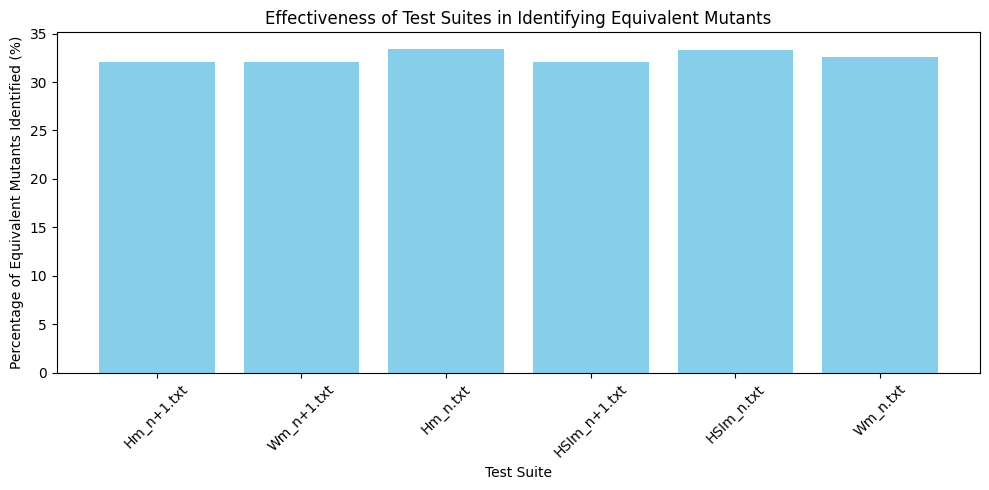

In [53]:
import os
import matplotlib.pyplot as plt

def evaluate_test_suites(fsm_configs, test_suite_paths):
    """ Evaluates each test suite's effectiveness in identifying unique FSMs. """
    results = {}
    for path in test_suite_paths:
        test_suites = parse_test_suites(path)
        unique_fsms, equivalent_fsms = filter_unique_fsms(fsm_configs, test_suites)
        # Calculate the effectiveness
        total_mutants = len(fsm_configs)
        num_equivalents = sum(len(dups) for dups in equivalent_fsms.values())
        percentage_killed = (num_equivalents / total_mutants) * 100 if total_mutants > 0 else 0
        results[path] = percentage_killed
    return results

def plot_results(results):
    """ Plots the results of test suite evaluations. """
    # Prepare data
    names = [os.path.basename(path) for path in results.keys()]
    values = list(results.values())

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.bar(names, values, color='skyblue')
    plt.xlabel('Test Suite')
    plt.ylabel('Percentage of Equivalent Mutants Identified (%)')
    plt.title('Effectiveness of Test Suites in Identifying Equivalent Mutants')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

def main():
    fsm_filepath = "/Users/mohammedhussam/Desktop/testing/mutants.txt"  # Path to FSM configurations
    test_suite_folder = '/Users/mohammedhussam/Downloads/FSM test suites/POP 3'  # Folder containing all test suite files

    # Load all FSM configurations
    fsm_configs = parse_fsm_configurations(fsm_filepath)

    # List all test suite files
    test_suite_paths = [os.path.join(test_suite_folder, f) for f in os.listdir(test_suite_folder) if f.endswith('.txt')]

    # Evaluate each test suite
    evaluation_results = evaluate_test_suites(fsm_configs, test_suite_paths)

    # Output the results
    for path, percentage in evaluation_results.items():
        print(f"Test suite {os.path.basename(path)} identified {percentage:.2f}% equivalent mutants.")

    # Plot the results
    plot_results(evaluation_results)

if __name__ == "__main__":
    main()
